In [46]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Imports

In [1]:
cd ../src

/home/theo/Kaggle/seversal/src


In [47]:
from util import *
from params import *
from metric import *
from params import *
from imports import *
from post_process import *
from pseudo_labeling import *

In [48]:
from data.masks import *
from data.dataset import *
from data.transforms import *
from data.transforms import get_transforms as transfos

In [49]:
from training.train import *
from training.freezing import *
from training.predicting import *

In [50]:
from model_zoo.unet import *
from model_zoo.fpn_enetb5 import *
from model_zoo.unet_densenet169 import *
from model_zoo.unet_seresnext50 import *

In [51]:
from tqdm import tqdm_notebook as tqdm

sns.set_style('white')
KERNEL_START_TIME = time.time()
warnings.simplefilter(action='ignore', category=UserWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)
# warnings.simplefilter(action='ignore', category=RuntimeWarning)
print('Number of available cores :', multiprocessing.cpu_count())

Number of available cores : 16


# Parameters

In [47]:
seed = 2019
seed_everything(seed)

In [48]:
TRAIN_IMG_PATH = '../input/train_images/'
TEST_IMG_PATH = '../input/test_images/'
DATA_PATH = '../input/'

In [49]:
IMG_SHAPE = (256, 1600)

In [50]:
MEAN = np.array([0.485, 0.456, 0.406])
STD = np.array([0.229, 0.224, 0.225])

In [51]:
NUM_WORKERS = 4

VAL_BS = 1  # seresnext
# VAL_BS = 4  #resnet

DEVICE = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

# Data

In [8]:
df_train = pd.read_csv('../input/train.csv')
df_train['EncodedPixels'].fillna('-1', inplace=True)

print('Number of training images : ', len(df_train) // 4)

Number of training images :  12568


In [9]:
df_train['ImageId'] = df_train['ImageId_ClassId'].apply(lambda x: x.split('_')[0])
df_train['ClassId'] = df_train['ImageId_ClassId'].apply(lambda x: x.split('_')[1])

group_img = df_train[['ImageId', 'EncodedPixels']].groupby('ImageId').agg(list)
rep_classes = group_img['EncodedPixels'].apply(pd.Series).rename(columns=lambda x : str(x))
rep_classes['ClassNumber'] = group_img['EncodedPixels'].apply(lambda x: len([i for i in x if i != "-1"]))

all_images = rep_classes.index.values
hard_negatives = rep_classes[rep_classes['ClassNumber'] == 0].index.values
positives = rep_classes[rep_classes['ClassNumber'] > 0].index.values

print('Number of images with defaults: ', len(positives))

Number of images with defaults:  6666


In [10]:
mask_dic = rep_classes.drop('ClassNumber', axis=1).to_dict('index')

In [11]:
classes, classes_max = get_classes(all_images, mask_dic)

# Retrieving Folds

In [12]:
k = 5
selected_fold = 0

In [13]:
splits = list(StratifiedKFold(n_splits=k, shuffle=True, random_state=seed).split(all_images, classes_max))
val_idx = splits[selected_fold][1]
post_process_idx, pp_val_idx = train_test_split(val_idx, test_size=0.5, random_state=seed)

val_dataset = SteelValDataset(mask_dic, all_images[val_idx], classes[val_idx], transfos(test=True))
post_process_dataset = SteelValDataset(mask_dic, all_images[post_process_idx], classes[post_process_idx], transfos(test=True))
pp_val_dataset = SteelValDataset(mask_dic, all_images[pp_val_idx], classes[pp_val_idx], transfos(test=True))

# Retrieving models

In [56]:
tta = True
use_aux_clf = True

In [57]:
models = []

In [58]:
backbone = 'se_resnext50_32x4d'
weights = 'unet_se_resnext50_32x4d_1_5.pt'
# [100, 300, 500, 100] [0.4, 0.3, 0.2, 0.4]

model = SegmentationUnet(SETTINGS[backbone], num_classes=4, center_block="aspp", aux_clf=True).to(DEVICE)
model = load_model_weights(model, weights, verbose=1, cp_folder='../saved_cps/final/')

models.append(model)


 -> Loading weights from ../saved_cps/final/unet_se_resnext50_32x4d_1_5.pt



In [18]:
backbone = 'se_resnext50_32x4d'
weights = 'UneXt50SE2_1_0_PL1.pt'

model = UneXt50SE(SETTINGS[backbone], num_classes=4, pre=False).to(DEVICE)
model = load_model_weights(model, weights, verbose=1, cp_folder='../saved_cps/final/')

models.append(model)


 -> Loading weights from ../saved_cps/final/UneXt50SE2_1_0_PL1.pt



In [19]:
weights = 'fpn_enetb5_1_5.pt'

model = SegmentationFPNEfficientNet(num_classes=4, center_block="aspp", aux_clf=True, pretrain_file='').to(DEVICE)
model = load_model_weights(model, weights, verbose=1, cp_folder='../saved_cps/final/')

models.append(model)


 -> Loading weights from ../saved_cps/final/fpn_enetb5_1_5.pt



In [20]:
backbone = 'se_resnext50_32x4d'
weights = 'UneXt50SE2_1_0_PL.pt'

model = UneXt50SE(SETTINGS[backbone], num_classes=4, pre=False).to(DEVICE)
model = load_model_weights(model, weights, verbose=1, cp_folder='../saved_cps/used/')

models.append(model)


 -> Loading weights from ../saved_cps/used/UneXt50SE2_1_0_PL.pt



In [21]:
backbone = 'se_resnext50_32x4d'
weights = 'unet_se_resnext50_32x4d_1_5.pt'

model = SegmentationUnet(SETTINGS[backbone], num_classes=4, center_block="aspp", aux_clf=True).to(DEVICE)
model = load_model_weights(model, weights, verbose=1, cp_folder='../saved_cps/used/')

models.append(model)


 -> Loading weights from ../saved_cps/used/unet_se_resnext50_32x4d_1_5.pt



In [22]:
weights = 'fpn_enetb5_1_5.pt'
model = SegmentationFPNEfficientNet(num_classes=4, center_block="aspp", aux_clf=True).to(DEVICE)
model = load_model_weights(model, weights, verbose=1, cp_folder='../saved_cps/used/')

models.append(model)


 -> Loading weights from ../saved_cps/used/fpn_enetb5_1_5.pt



In [23]:
weights = 'UDnet169_1_5.pt'

model =  UDnet169(_, num_classes=4, pre=False).to(DEVICE)
model = load_model_weights(model, weights, verbose=1, cp_folder='../saved_cps/final/')

models.append(model)


 -> Loading weights from ../saved_cps/final/UDnet169_1_5.pt



In [28]:
print(f'Using {len(models)} models for segmentation')

Using 1 models for segmentation


# Retriving classifier predictions

In [29]:
# PROBS = np.load('../output/probs_kfold_pl.npy')
# PROBS = np.load('../output/final_probs.npy')
PROBS = np.load('../output/probs_kfold_pl.npy')

PROBS_VAL = PROBS[val_idx]
PROBS_PP = PROBS[post_process_idx]
PROBS_PP_VAL = PROBS[pp_val_idx]
print(PROBS.shape)

prob_thresholds = [0.3, 0.25, 0.25, 0.25]

(12568, 4)


# Params

In [30]:
t = 1

In [31]:
prob_thresholds_max = [0] * 4

# Auxiliary  Classifier

In [32]:
prob_thresholds_auxs = []
faults_preds = []

for model in models: 
    faults_pred = predict_faults(val_dataset, model, tta=tta, batch_size=2)
    faults_preds.append(faults_pred)
    
    thresholds_aux = tweak_thresholds_clf(faults_pred, classes[val_idx])
    prob_thresholds_auxs.append(thresholds_aux)

In [33]:
prob_thresholds_auxs = np.array(prob_thresholds_auxs)
prob_thresholds_auxs

array([[0.58, 0.2 , 0.35, 0.56]])

In [34]:
prob_thresholds_auxs = np.array([[0.6, 0.2, 0.5, 0.3], # Seresnext 2
                                 [0.6, 0.3, 0.6, 0.5], # Iafoss 2
                                 [0.6, 0.2, 0.5, 0.3], # Effnet 2
                                 [0.4, 0.2, 0.6, 0.3], # Iafoss 1
                                 [0.5, 0.3, 0.4, 0.3], # Seresnext 1
                                 [0.5, 0.2, 0.5, 0.3], # Effnet 1
                                 [0.6, 0.3, 0.6, 0.4], # Densenet
                                ])

In [35]:
def plot_confusion_matrix(y_true, y_pred, classes=['0', '1'], normalize=False, title="", cmap=plt.cm.Blues):
    cm = confusion_matrix(y_true, y_pred)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)

    ax.set(
        xticks=[0, 1], 
#         yticks=[0, 1], 
        yticklabels=[], 
        xticklabels=[0, 1],
        title=title, ylabel='True label', xlabel='Predicted label')
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt), ha="center", va="center", color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()

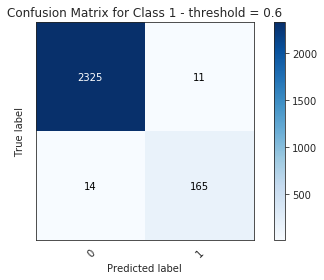

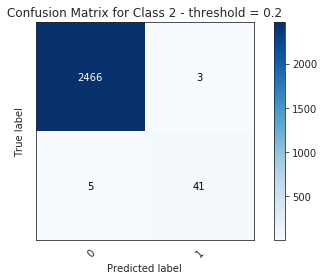

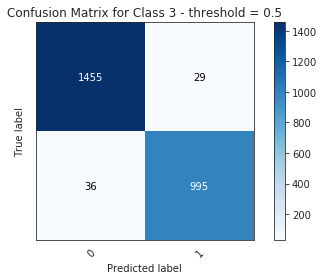

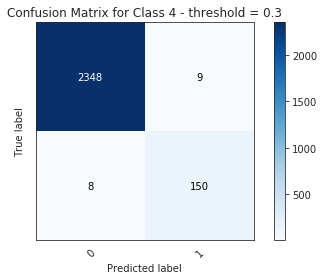

In [36]:
idx = 0
for i in range(4):
    plot_confusion_matrix((classes[val_idx] > 0).astype(int)[:, i], 
                          (faults_preds[idx] > prob_thresholds_auxs[idx, i]).astype(int)[:, i], 
                          title=f'Confusion Matrix for Class {i+1} - threshold = {prob_thresholds_auxs[idx, i]}', 
                          normalize=False)

# Mask processing

In [37]:
thresholds = np.arange(0.2, 0.51, 0.1)
min_sizes = np.arange(0, 501, 500)

In [38]:
best_thresholds = []
best_min_sizes = []

for idx, model in enumerate(models):
    print(f'\n -> Model #{idx + 1} \n')
    print('Using prob_thresholds : ', prob_thresholds)
    print('Using prob_thresholds_aux : ', prob_thresholds_auxs[idx])
    
    dices = tweak_thresholds(post_process_dataset, [model], PROBS_PP, thresholds=thresholds, min_sizes=min_sizes, 
                             prob_thresholds=prob_thresholds, prob_thresholds_aux=prob_thresholds_auxs[idx], 
                             tta=tta)
    best_threshold, best_min_size = get_best_params(dices, thresholds, min_sizes)
    
    print('\nBest thresholds :', best_threshold)
    print('Best min_sizes :', best_min_size)
    
    best_thresholds.append(best_threshold)
    best_min_sizes.append(best_min_size)



 -> Model #1 

Using prob_thresholds :  [0.3, 0.25, 0.25, 0.25]
Using prob_thresholds_aux :  [0.6 0.2 0.5 0.3]


Local validation dice is 0.9585

 -> Class 1 : 0.9740
 -> Class 2 : 0.9956
 -> Class 3 : 0.8820
 -> Class 4 : 0.9823

Best thresholds : [0.4 0.5 0.2 0.3]
Best min_sizes : [0. 0. 0. 0.]


In [39]:
best_thresholds = np.array(best_thresholds)
best_min_sizes = np.array(best_min_sizes)
prob_thresholds_auxs = np.array(prob_thresholds_auxs)

In [40]:
# best_thresholds = np.array([[0.4, 0.5, 0.2, 0.3], # Seresnext 2
#                             [0.2, 0.3, 0.3, 0.4], # Iafoss 2
#                             [0.5, 0.5, 0.5, 0.5], # Effnet 2
#                             [0.3, 0.5, 0.4, 0.4], # Iafoss 1
#                             [0.3, 0.5, 0.2, 0.2], # Seresnext 1
#                             [0.4, 0.5, 0.5, 0.4], # Effnet 1
#                            ])

# best_min_sizes = np.array([[0., 0., 0., 0.],      # Seresnext 2
#                            [0., 0., 0., 500.],    # Iafoss 2
#                            [500., 0., 500. , 0.], # Effnet 2
#                            [0., 0., 0., 500.],    # Iafoss 1
#                            [0., 500., 0., 0.],    # Seresnext 1
#                            [500., 0., 500. , 0.], # Effnet 1
#                           ])

# Predicting

## Predict

In [41]:
rles_val = predict_vote(pp_val_dataset, models, PROBS_PP_VAL, best_thresholds, best_min_sizes, 
                        prob_thresholds, prob_thresholds_auxs, prob_thresholds_max, 
                        t=t, tta=tta, batch_size=2)

In [42]:
for i in range(4):
    if prob_thresholds_max[i]:
        plot_confusion_matrix((classes[pp_val_idx] > 0).astype(int)[:, i], (probs_max > prob_thresholds_max[i]).astype(int)[:, i], 
                              title=f'Confusion Matrix for Class {i+1} - threshold = {prob_thresholds_max[i]}', normalize=False)

## Local validation score

In [53]:
val_dice = eval_predictions(pp_val_dataset, rles_val)

print(f'Local validation score is {val_dice:.4f}')

Local validation score is 0.9560


In [60]:
for i in range(len(models)):
    rles_val = predict_vote(pp_val_dataset, models[i:i+1], PROBS_PP_VAL, best_thresholds[i:i+1], best_min_sizes[i:i+1], 
                            prob_thresholds, prob_thresholds_auxs[i:i+1], prob_thresholds_max, 
                            t=t, tta=tta, batch_size=2)
    val_dice = eval_predictions(pp_val_dataset, rles_val)

    print(f'Local validation score is {val_dice:.4f}')

Local validation score is 0.9560


In [61]:
for i in range(len(models)):
    print(f'prob_thresholds_auxs.append({list(np.round(prob_thresholds_auxs[i], 2))})')
    print(f'prob_thresholds_maxs.append({[0, 0, 0, 0]})')
    print(f'thresholds.append({list(np.round(best_thresholds[i], 2))})')
    print(f'min_sizes.append({list(np.round(best_min_sizes[i], 2))})')
    print('')

prob_thresholds_auxs.append([0.6, 0.2, 0.5, 0.3])
prob_thresholds_maxs.append([0, 0, 0, 0])
thresholds.append([0.4, 0.5, 0.2, 0.3])
min_sizes.append([0.0, 0.0, 0.0, 0.0])



## Vizualising predictions

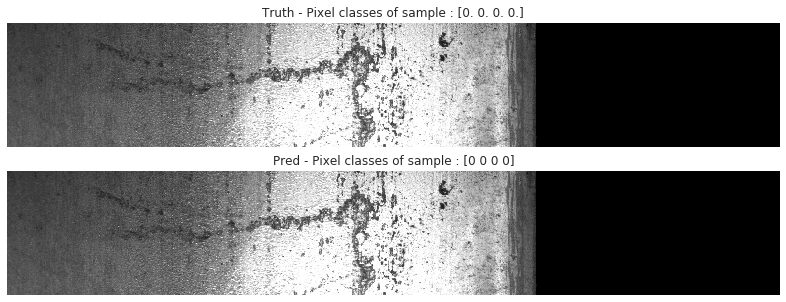

Sample dice is 1.0000


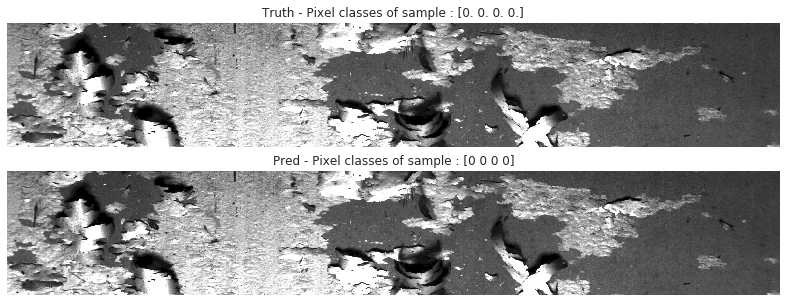

Sample dice is 1.0000


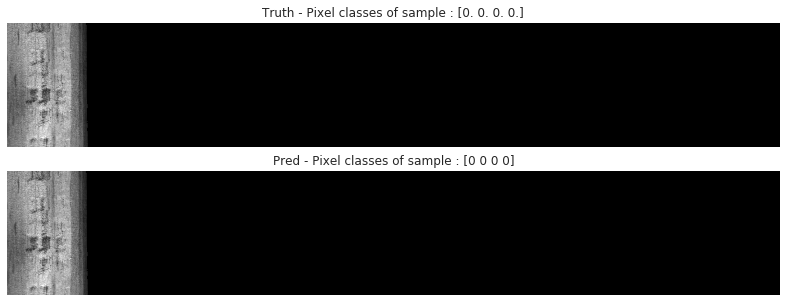

Sample dice is 1.0000


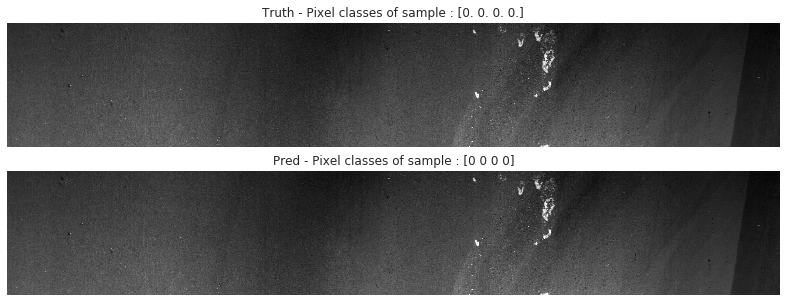

Sample dice is 1.0000


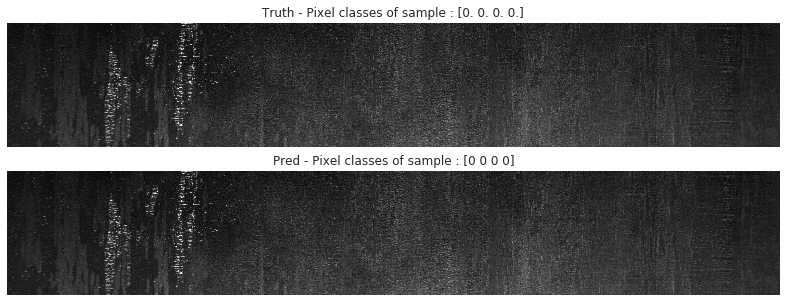

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 1.0000


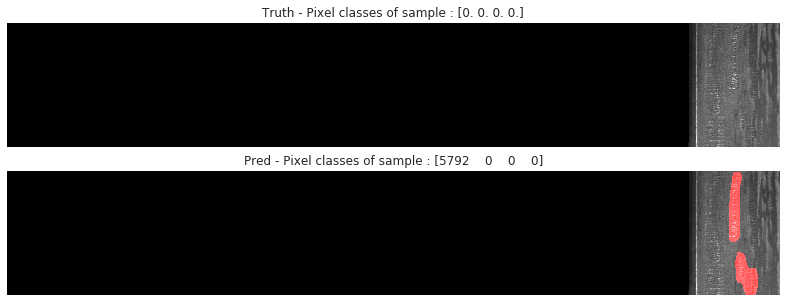

Sample dice is 0.7500


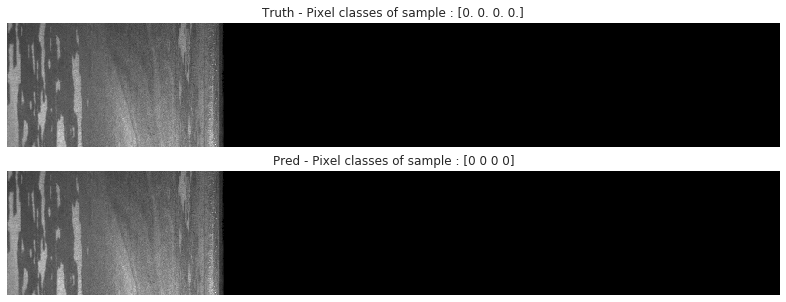

Sample dice is 1.0000


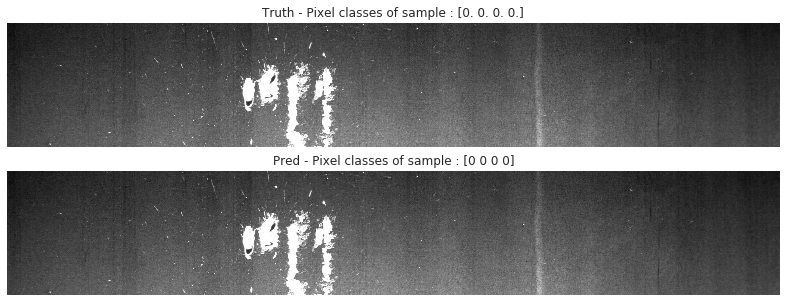

Sample dice is 1.0000


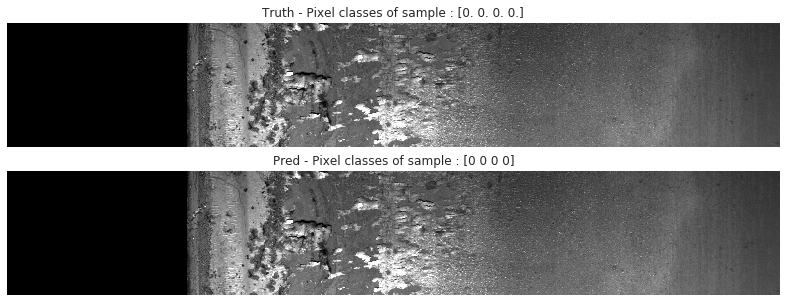

Sample dice is 1.0000


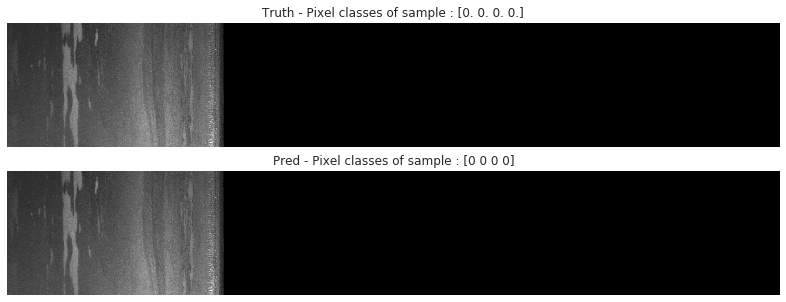

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 1.0000


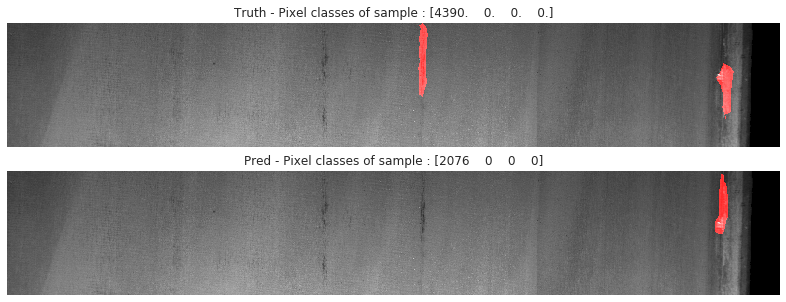

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.7981


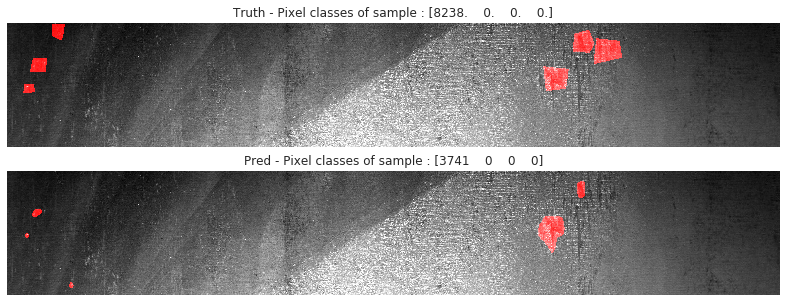

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.8614


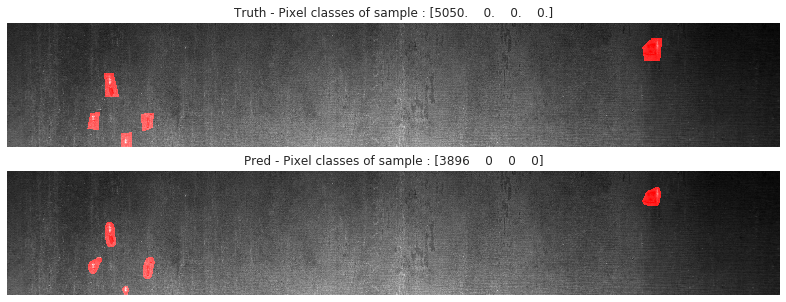

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9456


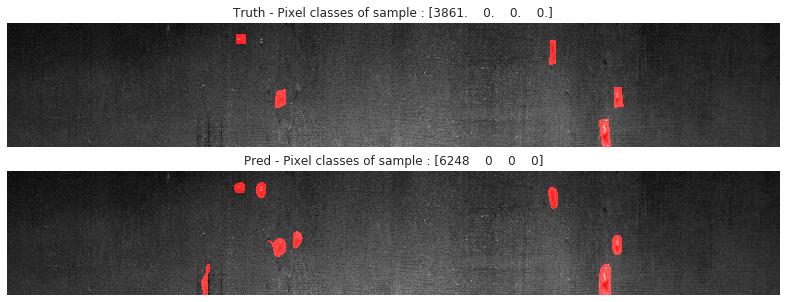

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9199


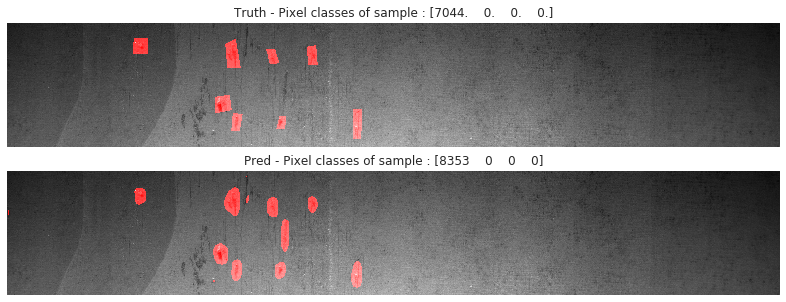

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9363


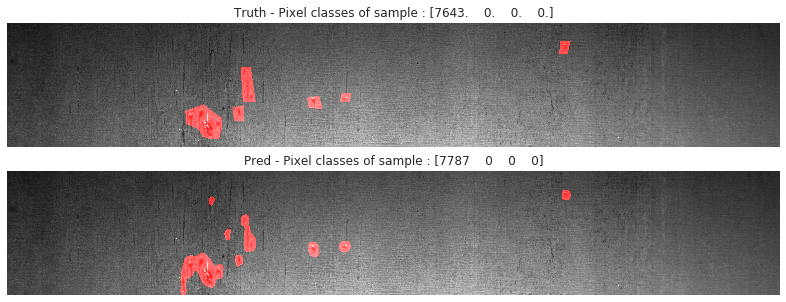

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9460


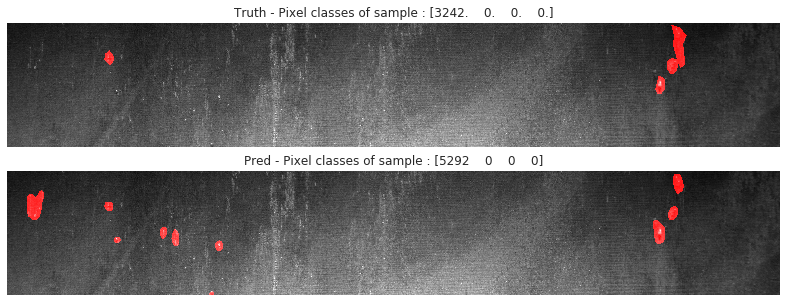

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.8669


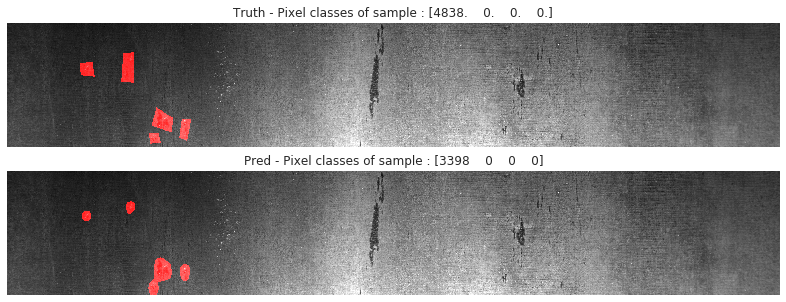

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9199


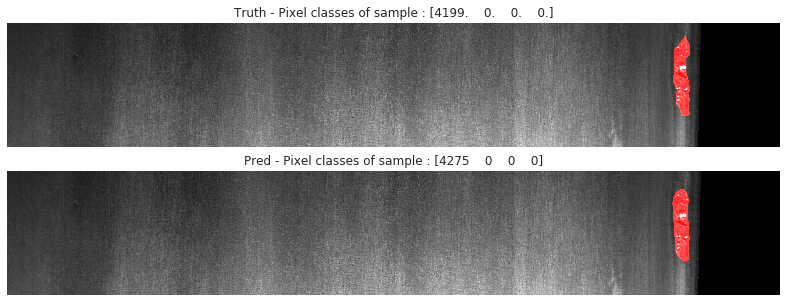

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9746


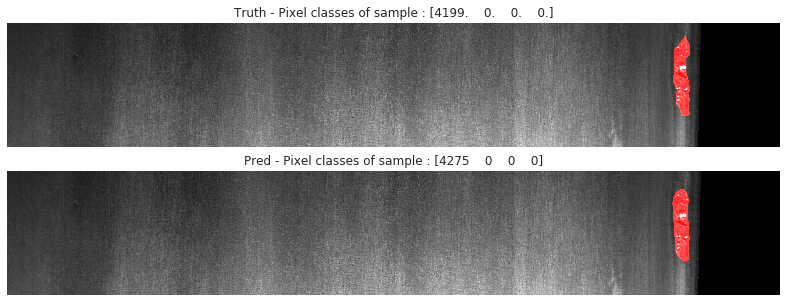

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9746


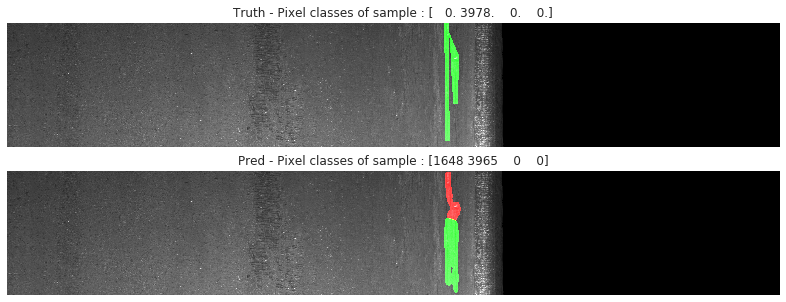

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.6256


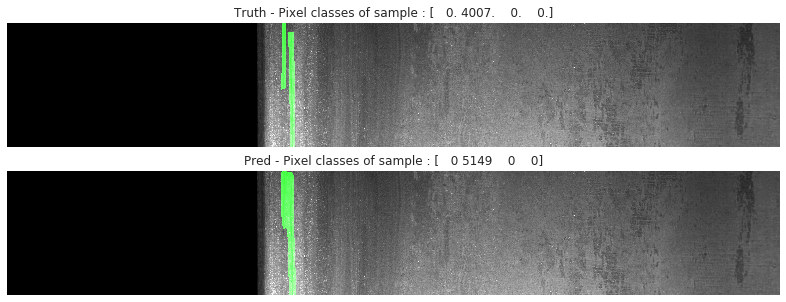

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9520


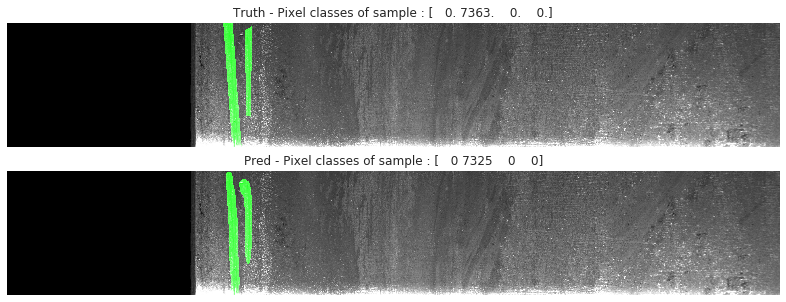

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9644


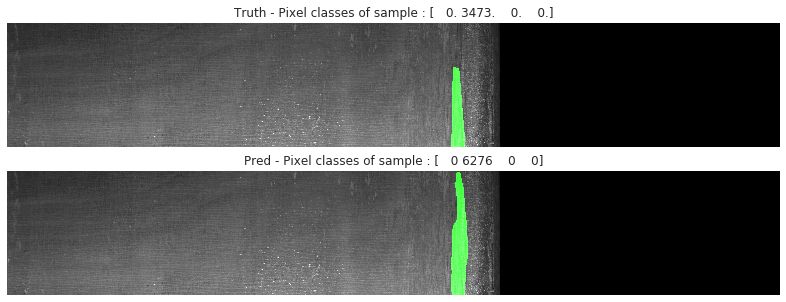

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9185


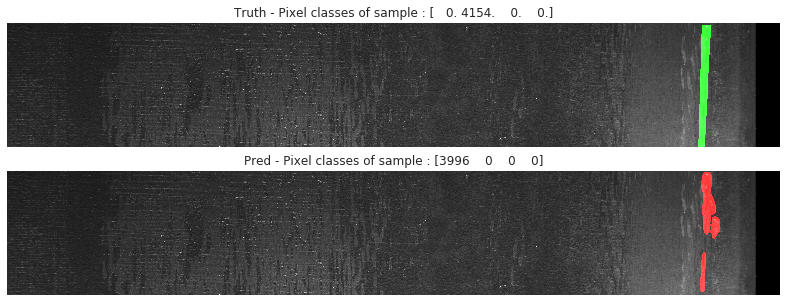

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.5000


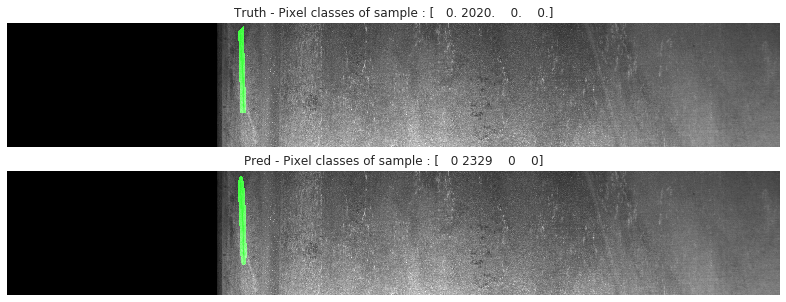

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9750


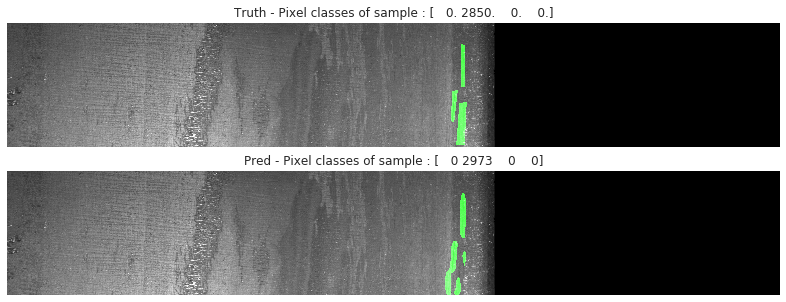

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.8987


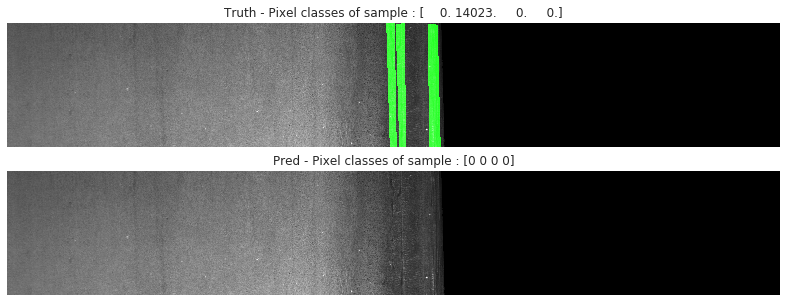

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.7500


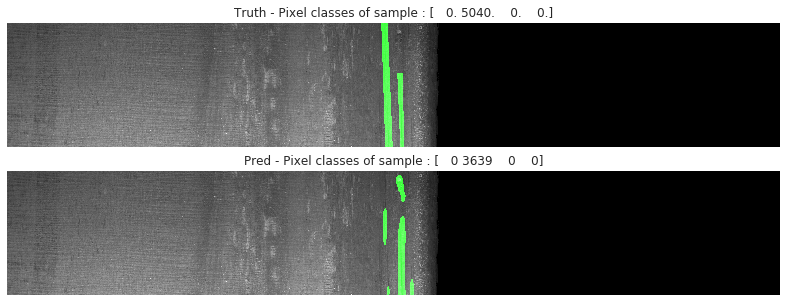

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.8647


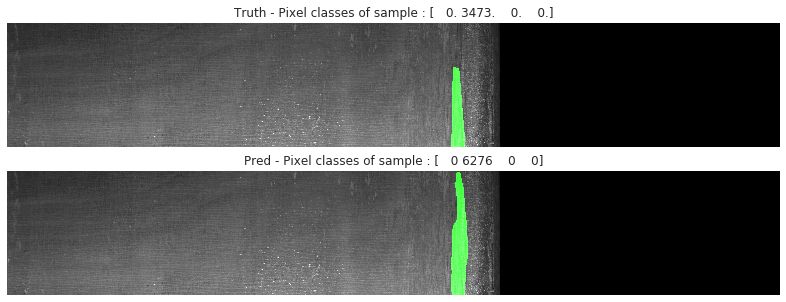

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9185


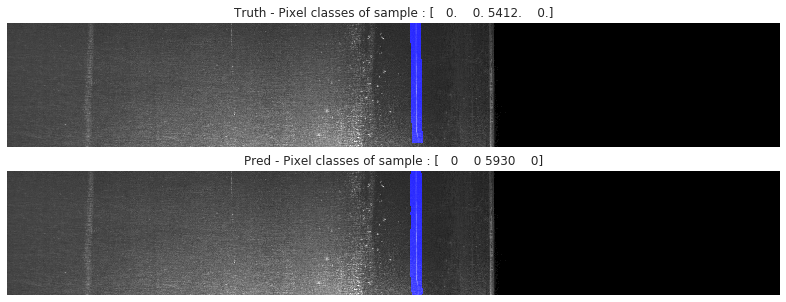

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9844


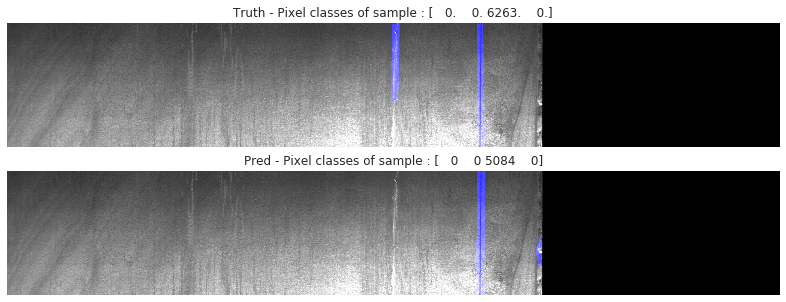

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9107


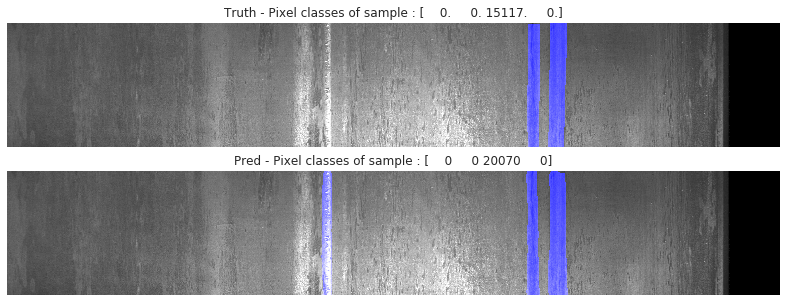

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9506


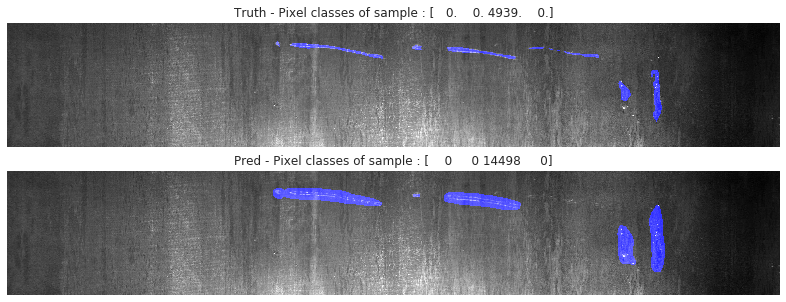

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.8617


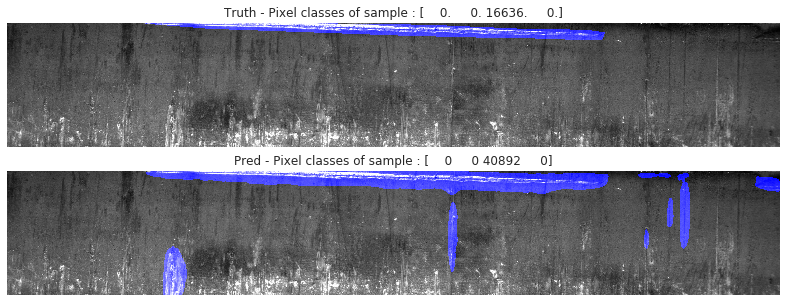

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.8944


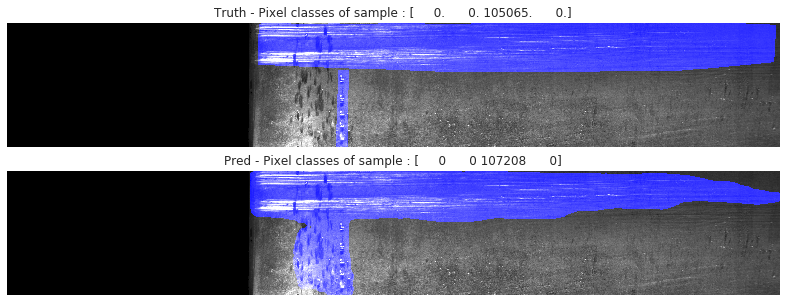

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9605


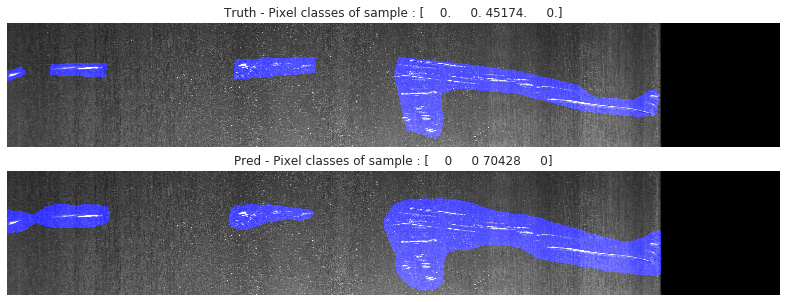

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9401


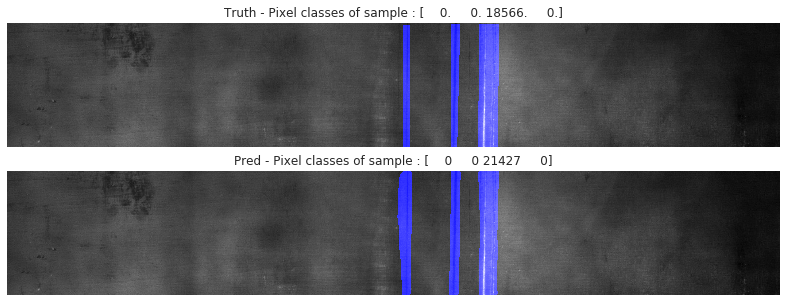

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9711


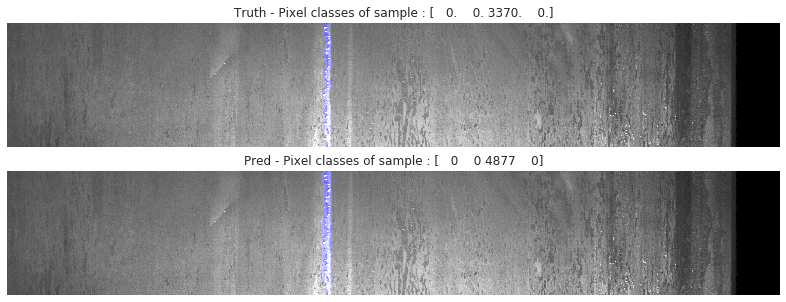

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9538


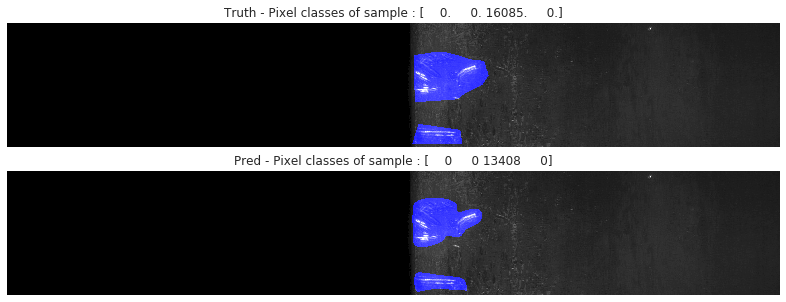

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9612


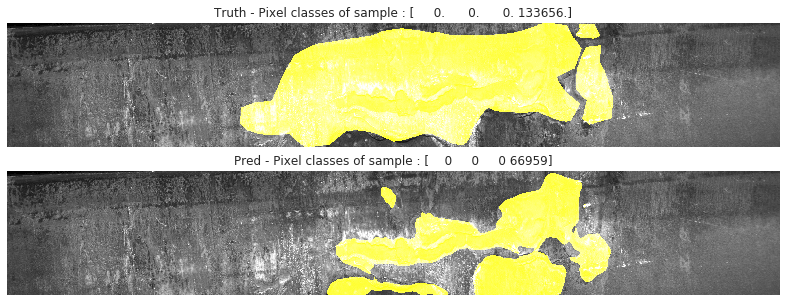

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.8655


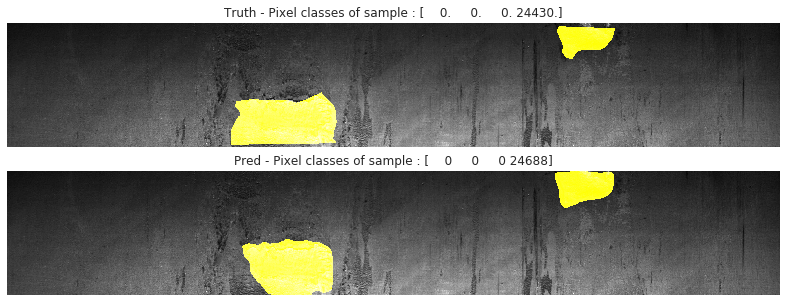

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9598


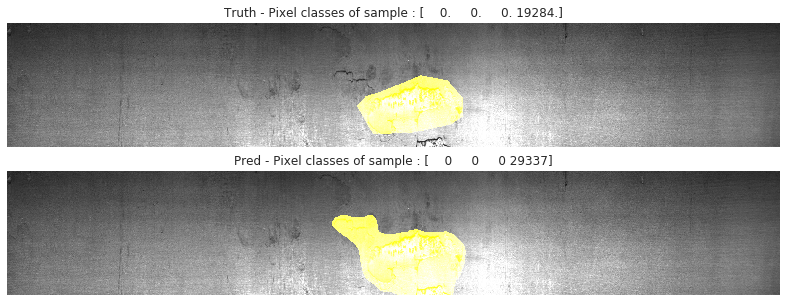

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9379


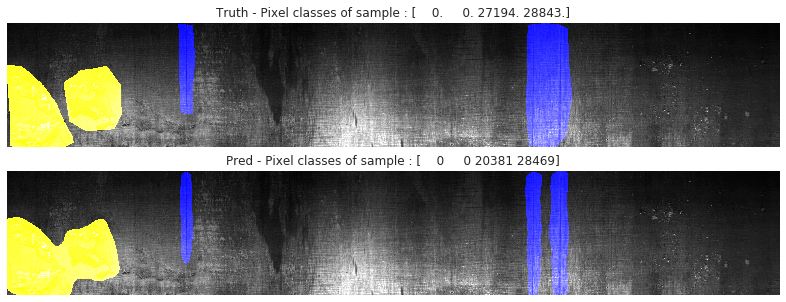

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9311


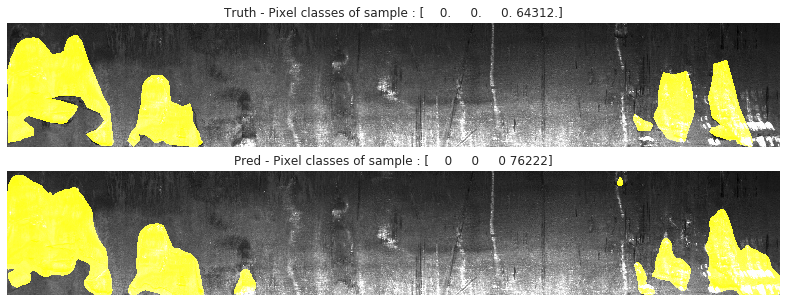

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9542


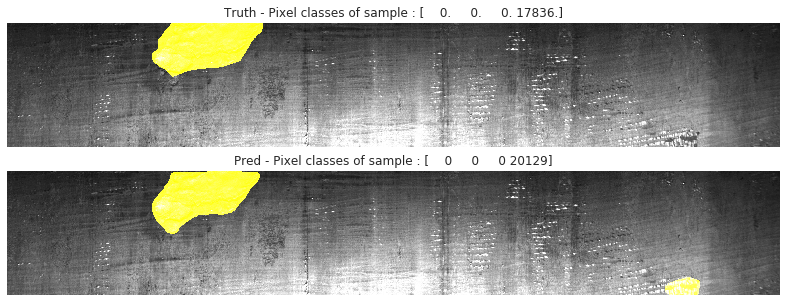

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9697


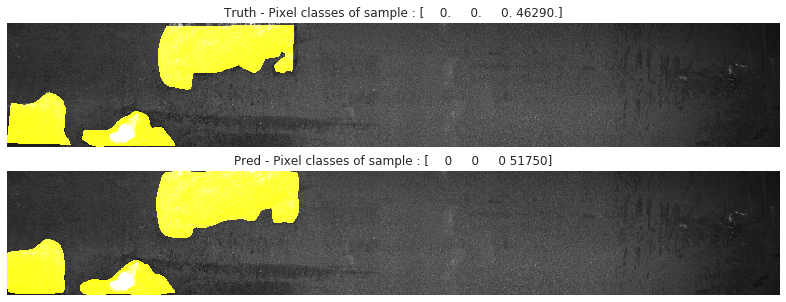

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9816


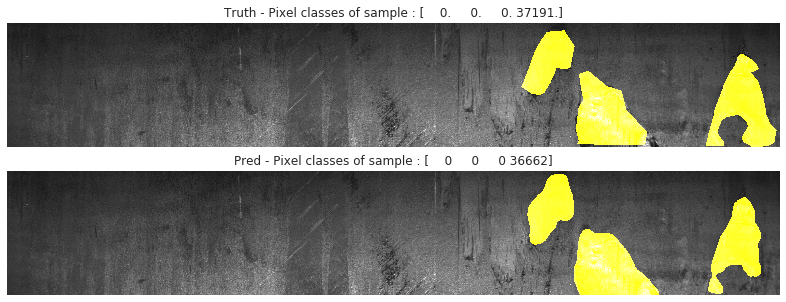

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.9658


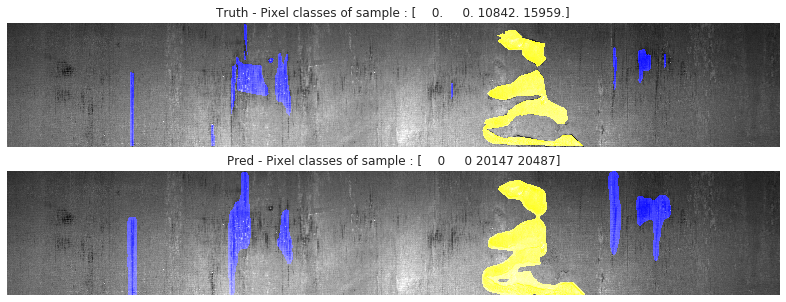

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample dice is 0.8146


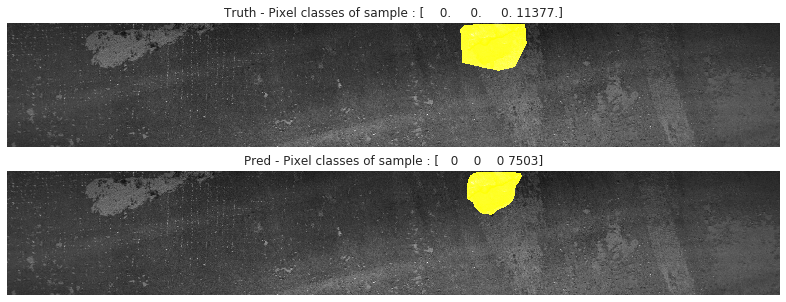

Sample dice is 0.9484


In [65]:
for i in range(5):
    viz_predictions(pp_val_dataset, rles_val, np.array(classes_max)[pp_val_idx], n=10, plot_classes=[i])

In [66]:
print(f'Done in {(time.time() - KERNEL_START_TIME) / 60 :.1f} minutes')

Done in 10.2 minutes
